## IMPORTS

In [1]:
%pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
%pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [70]:
# For All Imports
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import metrics

# For kNN only
from sklearn.neighbors import KNeighborsClassifier

# For Decision Tree only
from sklearn.tree import DecisionTreeClassifier, plot_tree

# For SVM only 
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# For Random Forest only
from IPython.display import Image
import graphviz
from random import randint

from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# For AdaBoost only
from sklearn.ensemble import AdaBoostClassifier


## Робота із [датасетом](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

### Зчитування [датасету](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

Ініціалізація датасету у змінну: "data_df". 

In [5]:
data_df = pd.read_csv('../DATASET/DATASET.csv')

### Вивід основної інформації про датасет.

Вивід декількох перших колонок.

In [6]:
data_df.head() #output names of columns

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.00,204.89,20791.32,7.30,368.52,564.31,10.38,86.99,2.96,0.0
1,3.72,129.42,18630.06,6.64,0.00,592.89,15.18,56.33,4.50,0.0
2,8.10,224.24,19909.54,9.28,0.00,418.61,16.87,66.42,3.06,0.0
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0.0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0.0


Вивід розміру датасету.

In [7]:
data_df.size

32760

Вивід інформації про тип данних у кожній колонці окремо та загальної інформації про таблицю.

In [8]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   float64
dtypes: float64(10)
memory usage: 256.1 KB


Вивід кількості рядків в кожному стовпчику, в якому є значення "null".

In [9]:

data_df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

Вивід кількості рядків в датасеті до очищення від нульових.

In [10]:
data_df.shape

(3276, 10)

Очищення та вивід кількості рядків після очищення.

In [11]:
# Знайдемо рядки зі значенням "#NUM!" і видалимо їх з набору даних

data_df = data_df[data_df != '#NUM!'].dropna()

data_df.shape

(3276, 10)

### Розбиття даних

In [12]:
X = data_df.drop(['Potability'], axis = 1)
y = data_df['Potability']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [13]:
X_train.head()


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
2713,6.85,199.78,26296.95,7.34,354.25,397.54,22.14,51.53,3.82
661,0.00,218.57,11724.62,7.57,296.43,452.73,14.67,51.26,3.56
703,7.33,233.72,16066.55,8.18,224.21,401.74,15.31,81.84,4.77
2831,5.09,148.00,39659.88,8.42,0.00,498.70,14.94,84.25,3.05
636,6.10,211.45,39352.78,6.21,0.00,488.14,11.79,46.93,4.59


In [14]:
X_test.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
2073,6.64,226.53,13730.26,9.06,257.46,275.07,12.78,0.00,3.81
2173,0.00,204.26,26321.69,5.94,0.00,487.27,20.41,70.34,3.31
3050,8.48,200.77,14901.81,7.38,0.00,485.09,16.81,53.13,4.22
1407,8.47,199.49,26559.38,7.90,351.74,491.52,9.50,66.15,2.94
2927,8.29,211.45,11234.04,6.39,360.84,525.09,15.10,63.00,3.58


In [15]:
print("Кількість рядків в тренувальних даних: \"" + str(X_train.shape[0]) + "\".")
print("Кількість рядків в тестових даних: \"" + str(X_test.shape[0]) + "\".")

Кількість рядків в тренувальних даних: "2620".
Кількість рядків в тестових даних: "656".


In [16]:
y_train.head()

2713    1.0
661     1.0
703     1.0
2831    1.0
636     0.0
Name: Potability, dtype: float64

In [17]:
y_test.head()

2073    0.0
2173    0.0
3050    0.0
1407    0.0
2927    0.0
Name: Potability, dtype: float64

In [18]:
print("Кількість рядків в тренувальних даних: \"" + str(y_train.shape[0]) + "\".")
print("Кількість рядків в тестових даних: \"" + str(y_test.shape[0]) + "\".")

Кількість рядків в тренувальних даних: "2620".
Кількість рядків в тестових даних: "656".


### Шкалювання даних

In [19]:
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

In [20]:
scaled_X_train = scaler.transform(X_train) 
scaled_X_test = scaler.transform(X_test) 

## kNN

In [32]:
knn = KNeighborsClassifier(n_neighbors=5)

In [33]:
knn.fit(scaled_X_train, y_train)

KNeighborsClassifier()

In [34]:
pred = knn.predict(scaled_X_test)

### Evaluation

In [35]:
print(confusion_matrix(y_test,pred))

[[281  97]
 [185  93]]


In [36]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

         0.0       0.60      0.74      0.67       378
         1.0       0.49      0.33      0.40       278

    accuracy                           0.57       656
   macro avg       0.55      0.54      0.53       656
weighted avg       0.55      0.57      0.55       656



In [37]:
print(accuracy_score(y_test,pred)) #відсоток правильних класифікацій

0.5701219512195121


In [38]:
error_rate = []

for i in range(1,30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(scaled_X_train,y_train)
    pred_i = knn.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

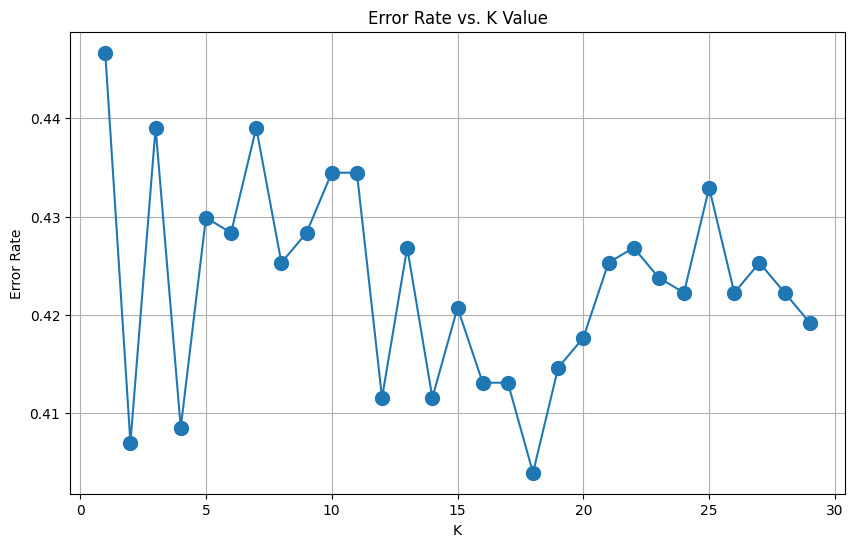

In [39]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.grid()

In [40]:
knn = KNeighborsClassifier(n_neighbors=7)

knn.fit(scaled_X_train,y_train)
pred = knn.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

[[292  86]
 [202  76]]

              precision    recall  f1-score   support

         0.0       0.59      0.77      0.67       378
         1.0       0.47      0.27      0.35       278

    accuracy                           0.56       656
   macro avg       0.53      0.52      0.51       656
weighted avg       0.54      0.56      0.53       656



## Дерево ухвалення рішень

In [52]:
set(y) # labels

{0.0, 1.0}

In [53]:
model = DecisionTreeClassifier(criterion='gini')

In [54]:
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [55]:
y_pred = model.predict(X_test)

In [56]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.63      0.69      0.66       378
         1.0       0.51      0.45      0.48       278

    accuracy                           0.59       656
   macro avg       0.57      0.57      0.57       656
weighted avg       0.58      0.59      0.58       656



In [57]:
print(confusion_matrix(y_test, y_pred))

[[260 118]
 [154 124]]


In [59]:
data_df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [63]:
plt.figure(figsize = (300, 300))
plot_tree(model, feature_names = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity'], class_names = ['0', '1'], filled = True)
plt.show()

## Support Vector Machine

In [71]:
model = SVC(C=1.0, gamma = 1.0, kernel = 'rbf', cache_size=7000)
model.fit(scaled_X_train,y_train)

SVC(cache_size=7000, gamma=1.0)

In [72]:
y_pred = model.predict(scaled_X_test)

### Evaluation

In [73]:
print(confusion_matrix(y_test, y_pred))

[[349  29]
 [257  21]]


In [74]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.58      0.92      0.71       378
         1.0       0.42      0.08      0.13       278

    accuracy                           0.56       656
   macro avg       0.50      0.50      0.42       656
weighted avg       0.51      0.56      0.46       656



In [75]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

In [76]:
grid = GridSearchCV(SVC(), param_grid, refit=True)

In [77]:
grid.fit(scaled_X_train,y_train) #пошук найкращих параметрів

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [78]:
grid.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

In [79]:
grid.best_estimator_

SVC(C=10, gamma=0.1)

In [80]:
grid_predictions = grid.predict(scaled_X_test)
print(confusion_matrix(y_test,grid_predictions))

[[297  81]
 [195  83]]


In [81]:
print(classification_report(y_test,grid_predictions))

              precision    recall  f1-score   support

         0.0       0.60      0.79      0.68       378
         1.0       0.51      0.30      0.38       278

    accuracy                           0.58       656
   macro avg       0.55      0.54      0.53       656
weighted avg       0.56      0.58      0.55       656



## Random Forest

In [92]:
random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=200)
random_forest.fit(scaled_X_train, y_train)

RandomForestClassifier(max_depth=2, n_estimators=200, random_state=0)

In [93]:
pred = random_forest.predict(scaled_X_test)

In [94]:
print(confusion_matrix(y_test,pred))

[[378   0]
 [278   0]]


In [95]:
print(classification_report(y_test,pred, zero_division=1))

              precision    recall  f1-score   support

         0.0       0.58      1.00      0.73       378
         1.0       1.00      0.00      0.00       278

    accuracy                           0.58       656
   macro avg       0.79      0.50      0.37       656
weighted avg       0.76      0.58      0.42       656



In [96]:
print(accuracy_score(y_test,pred)) #відсоток правильних класифікацій

0.5762195121951219


### Choosing parameter

In [97]:
error_rate = []

for i in range(1,30):
    random_forest = RandomForestClassifier(max_depth=i, random_state=0, n_estimators=200)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test)) #Розраховується середнє значення помилки класифікації для поточної максимальної глибини 

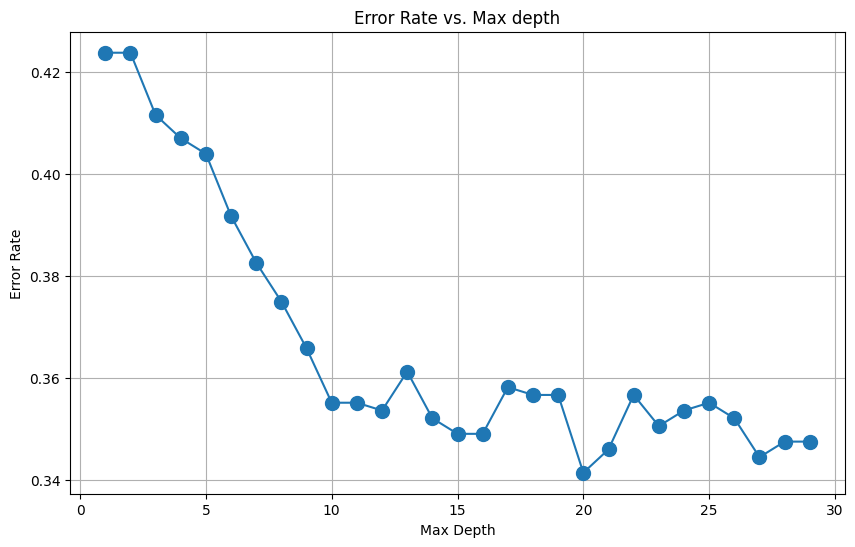

In [98]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. Max depth')
plt.xlabel('Max Depth')
plt.ylabel('Error Rate')
plt.grid()

In [99]:
error_rate = []

for i in range(1,500):
    random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=i)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

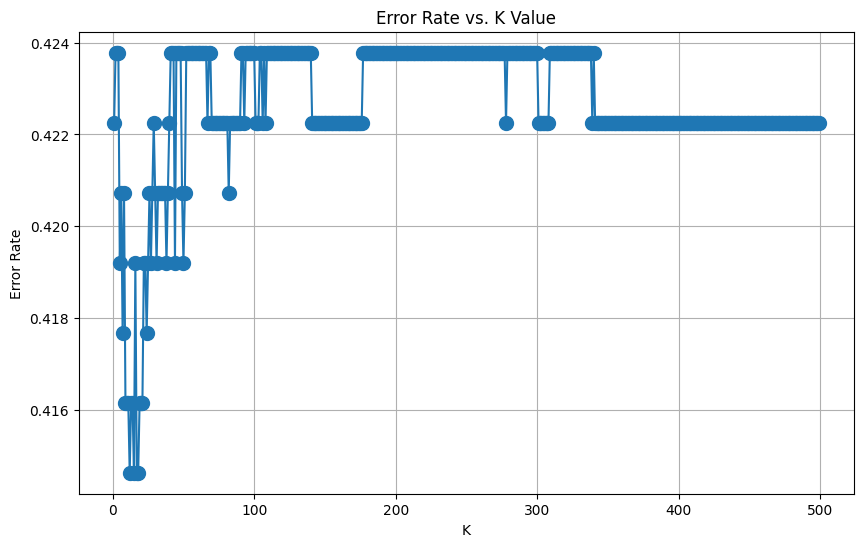

In [100]:
plt.figure(figsize=(10,6))
plt.plot(range(1,500), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.grid()

In [101]:
random_forest = RandomForestClassifier()
random_forest.fit(scaled_X_train, y_train)
pred = random_forest.predict(scaled_X_test)
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}
rand_search = RandomizedSearchCV(random_forest, 
                                 param_distributions = param_dist, 
                                 n_iter=5, 
                                 cv=5)
print('Best hyperparameters:',  rand_search)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

Best hyperparameters: RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': 9, 'n_estimators': 443})
[[338  40]
 [189  89]]

              precision    recall  f1-score   support

         0.0       0.64      0.89      0.75       378
         1.0       0.69      0.32      0.44       278

    accuracy                           0.65       656
   macro avg       0.67      0.61      0.59       656
weighted avg       0.66      0.65      0.62       656



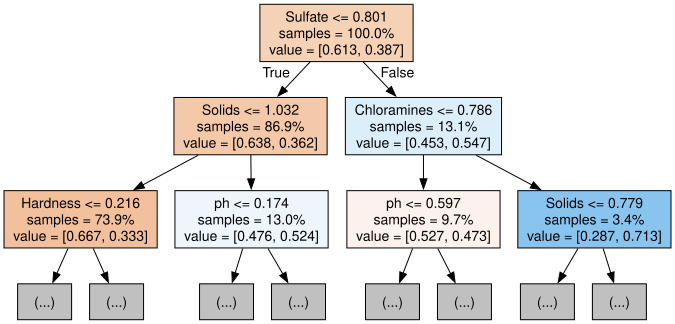

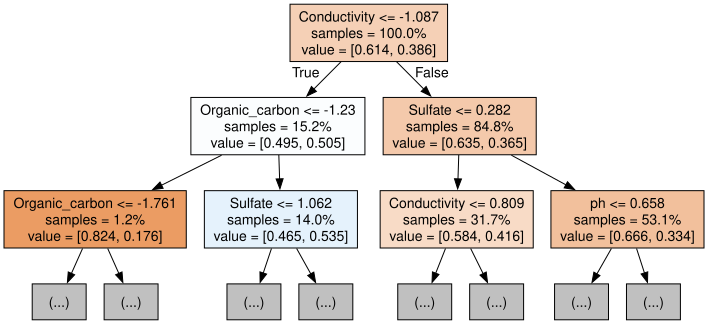

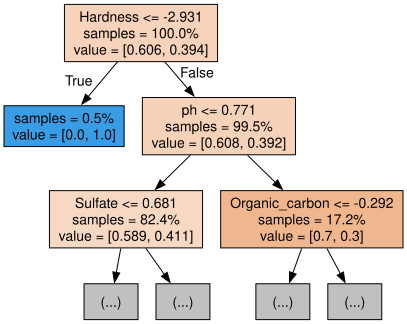

In [102]:
for i in range(3):
    tree = random_forest.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train.columns,  
                               filled=True,  
                               max_depth=2, 
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

## AdaBoost

In [103]:
abc = AdaBoostClassifier(n_estimators=50,
                         learning_rate=1)
abc.fit(scaled_X_train, y_train)

AdaBoostClassifier(learning_rate=1)

In [104]:
pred = abc.predict(scaled_X_test)

### Оцінка

In [105]:
print(confusion_matrix(y_test,pred))

[[318  60]
 [223  55]]


In [106]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

         0.0       0.59      0.84      0.69       378
         1.0       0.48      0.20      0.28       278

    accuracy                           0.57       656
   macro avg       0.53      0.52      0.49       656
weighted avg       0.54      0.57      0.52       656



In [107]:
print(accuracy_score(y_test,pred)) #відсоток правильних класифікацій

0.5685975609756098


### Вибір параметрів

In [108]:
error_rate = []

for i in range(1,50):
    abc = AdaBoostClassifier(n_estimators=i, learning_rate=1)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

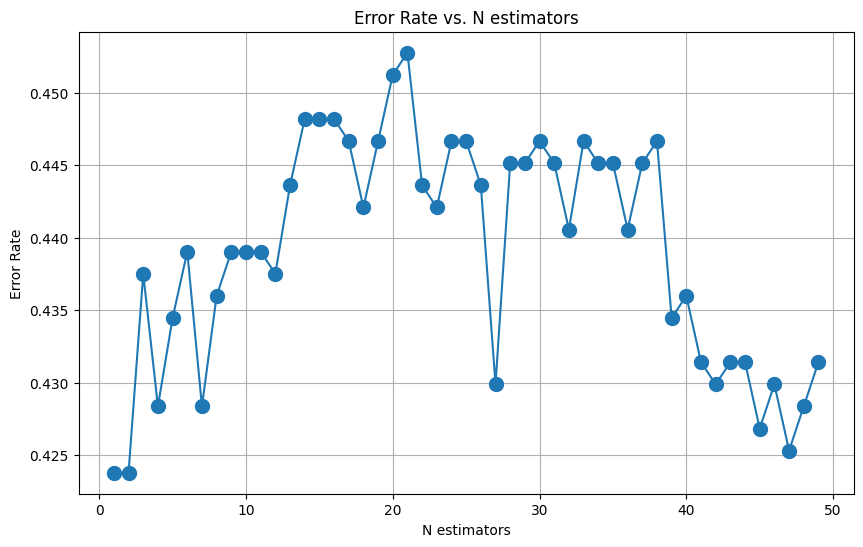

In [109]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. N estimators')
plt.xlabel('N estimators')
plt.ylabel('Error Rate')
plt.grid()

In [110]:
error_rate = []

for i in range(1,20):
    abc = AdaBoostClassifier(n_estimators=5, learning_rate=i)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

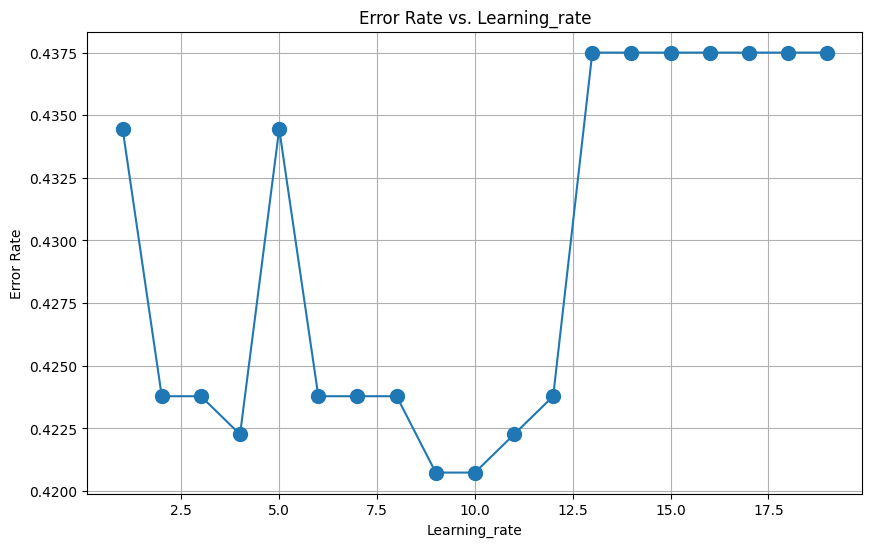

In [111]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. Learning_rate')
plt.xlabel('Learning_rate')
plt.ylabel('Error Rate')
plt.grid()

In [112]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)

abc.fit(scaled_X_train, y_train)
pred = abc.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

[[318  60]
 [223  55]]

              precision    recall  f1-score   support

         0.0       0.59      0.84      0.69       378
         1.0       0.48      0.20      0.28       278

    accuracy                           0.57       656
   macro avg       0.53      0.52      0.49       656
weighted avg       0.54      0.57      0.52       656

